<a href="https://colab.research.google.com/github/victor-radermecker/Capstone_JPMorgan/blob/conv-lstm/Notebooks/ConvLSTM_colab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [35]:
!pip install -q geopandas
!pip install -q geemap
!pip install -q imageio
!pip install -q imagecodecs

In [36]:
from google.colab import drive
drive.mount('/content/drive', force_remount = True)

Mounted at /content/drive


In [37]:
import sys
from tqdm import tqdm
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

# import local modules
sys.path.append('/content/drive/MyDrive/src')

# update files automatically
%load_ext autoreload
%autoreload 2

## Install package within conda using tensorflow
## /opt/homebrew/Caskroom/miniconda/base/envs/capstone_2/bin/pip install tensorflow

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [38]:
data = pd.read_csv("/content/drive/MyDrive/Code/urbanization.csv")

In [39]:
data.shape

(158067, 4)

In [40]:
"""
#compute rows and cols in Fishnet
dc = fc.filtered_fishnet.copy()
L = dc["geometry"].bounds["maxx"].max() - dc["geometry"].bounds["minx"].min()
H = dc["geometry"].bounds["maxy"].max() - dc["geometry"].bounds["miny"].min()

rows = int(H / fc.tile_height_degrees)
cols = int(L / fc.tile_width_degrees)
print(f"Number of rows: {rows}, Number of columns: {cols}")
"""

'\n#compute rows and cols in Fishnet\ndc = fc.filtered_fishnet.copy()\nL = dc["geometry"].bounds["maxx"].max() - dc["geometry"].bounds["minx"].min()\nH = dc["geometry"].bounds["maxy"].max() - dc["geometry"].bounds["miny"].min()\n\nrows = int(H / fc.tile_height_degrees)\ncols = int(L / fc.tile_width_degrees)\nprint(f"Number of rows: {rows}, Number of columns: {cols}")\n'

In [41]:
rows = 117
cols = 193

In [42]:
# Generate tensor
years = [2016, 2017, 2018, 2019, 2020, 2021, 2022]
tensor = np.zeros((len(years), rows, cols, 1))

for yr in tqdm(years):
    tensor[years.index(yr), :, :, 0] = data[data["year"]== yr]["urbanization"].to_numpy().reshape(rows, cols)

100%|██████████| 7/7 [00:00<00:00, 670.37it/s]


In [43]:
tensor.shape

(7, 117, 193, 1)

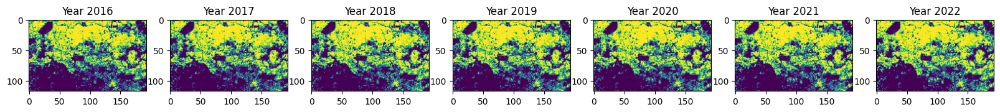

In [44]:
# plot consecutively to see the change
fig, ax = plt.subplots(1, 7, figsize=(20, 5))
for i in range(7):
    ax[i].imshow(tensor[i, :, :, 0])
    ax[i].set_title(f"Year {years[i]}")

# Now, we need to generate the dataset.

We need a data loader. We need to generate a dataset of that dimension:
(NBR_SAMPLE, TIME_SEQ, IMG_WIDTH, IMG_HEIGHT, CHANNELS)

@TODO:

1. Define proper loss function for the neural network (MSE)
2. Check which frames are used for training
3. Add TensorBoard
4. Brainstorm the architecture
5. ✅ Start training from a pre-trained network


In [45]:
def extract_submatrix(matrix, length, slide_size):
    submatrices = []
    rows, cols = matrix.shape
    for i in range(0, rows - (length - 1), slide_size):
        for j in range(0, cols - (length - 1), slide_size):
            submatrix = matrix[i:i+length, j:j+length]
            submatrices.append(submatrix)
    return np.array(submatrices)

def generate_submatrices(tensor, years, length, slide_size):
    submatrices = []
    for i, yr in enumerate(years):
        mat = tensor[i, :, :, 0]
        submatrices.append(extract_submatrix(mat, length, slide_size))
    submatrices = np.array(submatrices)
    print(np.array(submatrices).shape)
    transposed_array = np.transpose(submatrices, (1, 0, 2, 3))
    reshaped_array = transposed_array.reshape((-1, 7, length, length, 1))
    return reshaped_array

In [46]:
tensor.shape

(7, 117, 193, 1)

In [47]:
TIME_SEQ = 7  # frames
IMG_SIZE = 15  # tiles
SLIDE_WDW = 5 # tiles

sub_matrices = generate_submatrices(tensor, years, IMG_SIZE, SLIDE_WDW)
sub_matrices.shape

(7, 756, 15, 15)


(756, 7, 15, 15, 1)

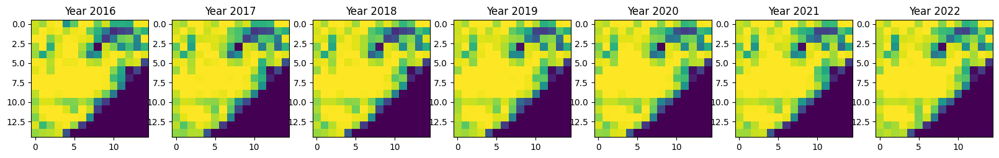

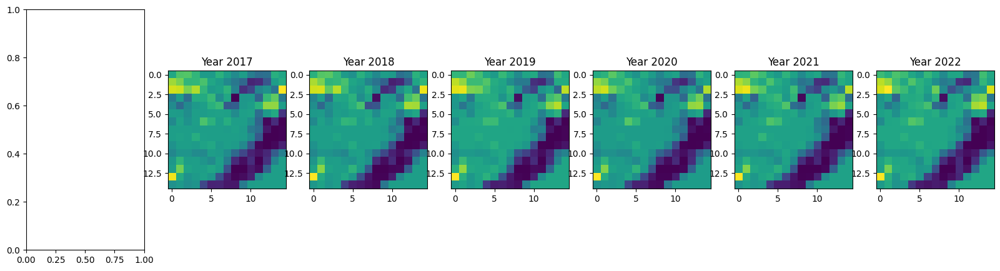

In [48]:
sub_matrices[1].shape

# plot all these images on 7 plots
fig, ax = plt.subplots(1, 7, figsize=(20, 5))
for i in range(7):
    ax[i].imshow(sub_matrices[3][i, :, :, 0])
    ax[i].set_title(f"Year {years[i]}")

# plot all these images on 7 plots
fig, ax = plt.subplots(1, 7, figsize=(20, 5))
for i in range(1, 7):
    ax[i].imshow(sub_matrices[3][i, :, :, 0] - sub_matrices[2][i, :, :, 0])
    ax[i].set_title(f"Year {years[i]}")

In [49]:
dataset = sub_matrices

# We'll define a helper function to shift the frames, where
# `x` is frames 0 to n - 1, and `y` is frames 1 to n.
def generate_shited_frames(data, type):
    shape = data.shape
    if type == "train":
        x_1 = data[:, 0 : 4, :, :]
        y_1 = data[:, 4, :, :]
        x_2 = data[:, 1 : 5, :, :]
        y_2 = data[:, 5, :, :]
        x = np.concatenate((x_1, x_2))
        y = np.concatenate((y_1, y_2)).reshape((data.shape[0]*2,1, data.shape[2], data.shape[3], data.shape[4]))
    elif type == "validation":
        x = data[:, 2 : 6, :, :]
        y = data[:, 6, :, :].reshape(data.shape[0],1, data.shape[2], data.shape[3], data.shape[4])
    else:
        raise ValueError("Type must be train or validation")
    return x, y

# Apply the processing function to the datasets.
x_train, y_train = generate_shited_frames(dataset, "train")
x_val, y_val = generate_shited_frames(dataset, "validation")

# Inspect the dataset.
print("Training Dataset Shapes: " + str(x_train.shape) + ", " + str(y_train.shape))
print("Validation Dataset Shapes: " + str(x_val.shape) + ", " + str(y_val.shape))

Training Dataset Shapes: (1512, 4, 15, 15, 1), (1512, 1, 15, 15, 1)
Validation Dataset Shapes: (756, 4, 15, 15, 1), (756, 1, 15, 15, 1)


Displaying frames for example 435.


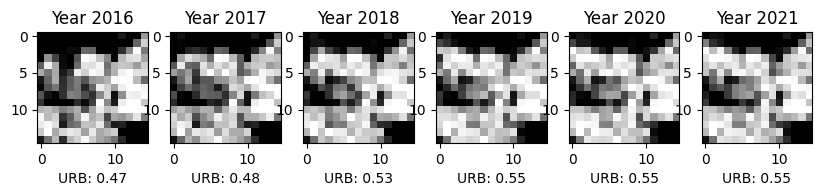

In [50]:
# Construct a figure on which we will visualize the images.
fig, axes = plt.subplots(1, 6, figsize=(10, 8))

# Plot each of the sequential images for one random data example.
data_choice = np.random.choice(range(len(dataset)), size=1)[0]
for idx, ax in enumerate(axes.flat):
    ax.imshow(np.squeeze(dataset[data_choice][idx]), cmap="gray")
    ax.set_title(f"Year {years[idx]}")
    # ax.axis("off")
    ax.set_xlabel(f"URB: {np.mean(dataset[data_choice][idx]):.2f}")

# Print information and display the figure.
print(f"Displaying frames for example {data_choice}.")
plt.show()

In [51]:
import tensorflow as tf
from tensorflow import keras
from keras import layers

import io
import imageio
from IPython.display import Image, display
from ipywidgets import widgets, Layout, HBox
import datetime

In [52]:
tf.random.set_seed(42)

In [53]:
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

Num GPUs Available:  1


In [54]:
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


In [55]:
def create_model():
    # Construct the input layer with 4 time frames in input
    inp = layers.Input(shape=(4, *x_train.shape[2:]))

    # We will construct 3 `ConvLSTM2D` layers with batch normalization,
    # followed by a `Conv3D` layer for the spatiotemporal outputs.
    x = layers.ConvLSTM2D(
        filters=64,                # transform each image into a 64 channel image
        kernel_size=(3, 3),        # each image [7,7] --> [5,5] (with 64 channels, see above, filters)
        padding="same",           # valid: no padding (so image stays [5,5], same: padding so image stays [6x6])
        return_sequences=True,
        activation="relu",
    )(inp)
    x = layers.BatchNormalization()(x)   # improve the training speed, stability, and generalization of the network
    x = layers.ConvLSTM2D(
        filters=64,                      #
        kernel_size=(3, 3),              # each previous [5,5] image --> [3,3] image
        padding="same",
        return_sequences=True,
        activation="relu",
    )(x)
    x = layers.BatchNormalization()(x)
    x = layers.ConvLSTM2D(
        filters=64,
        kernel_size=(1, 1),
        padding="same",
        return_sequences=False,
        activation="relu",
    )(x)
    x = layers.Conv2D(
        filters=1,               # 1 filter leads to one chanel in the output
        kernel_size=(3, 3),   #
        activation="sigmoid",
        padding="same"
    )(x)

    # Next, we will build the complete model and compile it.
    model = keras.models.Model(inp, x)
    # model.compile(
    #     loss=keras.losses.MeanSquaredError, optimizer=keras.optimizers.legacy.Adam(),
    # )
    model.compile(optimizer="adam", loss=tf.keras.losses.MeanSquaredError())
    return model

# Train the model from scratch
model = create_model()

# Training the model

In [56]:
%load_ext tensorboard

import datetime
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

%tensorboard --logdir logs/fit

tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)


The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [57]:
"""
!pip install -q tensorboard
import tensorboard

# add Tensorboard to visualize training results
%load_ext tensorboard
%tensorboard --logdir runs

# Set tensorboard Callback
log_dir = "./logs/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)
"""

'\n!pip install -q tensorboard\nimport tensorboard\n\n# add Tensorboard to visualize training results\n%load_ext tensorboard\n%tensorboard --logdir runs\n\n# Set tensorboard Callback\nlog_dir = "./logs/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")\ntensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)\n'

In [58]:
# Define some callbacks to improve training.
early_stopping = keras.callbacks.EarlyStopping(monitor="val_loss", patience=10)
reduce_lr = keras.callbacks.ReduceLROnPlateau(monitor="val_loss", patience=5)

# Define modifiable training hyperparameters.
epochs = 50
batch_size = 64

# Fit the model to the training data.
model.fit(
    x_train,
    y_train,
    batch_size=batch_size,
    epochs=epochs,
    validation_data=(x_val, y_val),
    callbacks=[tensorboard_callback], #early_stopping, reduce_lr],
)

Epoch 1/50
24/24 [==============================] - 18s 119ms/step - loss: 0.1075 - val_loss: 0.1628
Epoch 2/50
24/24 [==============================] - 2s 91ms/step - loss: 0.0979 - val_loss: 0.1618
Epoch 3/50
24/24 [==============================] - 2s 101ms/step - loss: 0.0944 - val_loss: 0.1613
Epoch 4/50
24/24 [==============================] - 2s 99ms/step - loss: 0.0914 - val_loss: 0.1609
Epoch 5/50
24/24 [==============================] - 2s 97ms/step - loss: 0.0898 - val_loss: 0.1600
Epoch 6/50
24/24 [==============================] - 2s 88ms/step - loss: 0.0887 - val_loss: 0.1600
Epoch 7/50
24/24 [==============================] - 2s 87ms/step - loss: 0.0876 - val_loss: 0.1607
Epoch 8/50
24/24 [==============================] - 2s 87ms/step - loss: 0.0881 - val_loss: 0.1590
Epoch 9/50
24/24 [==============================] - 2s 88ms/step - loss: 0.0861 - val_loss: 0.1601
Epoch 10/50
24/24 [==============================] - 2s 96ms/step - loss: 0.0850 - val_loss: 0.1625
Epoch 

In [59]:
# predict the values of the test set using keras
y_pred = model.predict(x_val)

24/24 [==============================] - 1s 8ms/step


In [60]:
y_pred.shape

(756, 15, 15, 1)

In [61]:
y_val.shape

(756, 1, 15, 15, 1)

In [62]:
# flatten the y tensors
y_pred_flat = y_pred.flatten()
y_val_flat = y_val.flatten()

# compute the R^2
from sklearn.metrics import r2_score

r2_score(y_val_flat, y_pred_flat)

0.3939533872556099

In [63]:
np.sqrt(0.0015)

# 0.038

0.03872983346207417

In [64]:
data.groupby('year').mean()

,tile_id,batch_id,urbanization
year,,,
2016,6249852.0,24562.084717,0.461611
2017,6249852.0,24562.084717,0.470271
2018,6249852.0,24562.084717,0.489959
2019,6249852.0,24562.084717,0.489318
2020,6249852.0,24562.084717,0.492546
2021,6249852.0,24562.084717,0.499365
2022,6249852.0,24562.084717,0.516641


In [65]:
0.038 / 0.46161

0.08232057364441844

In [68]:
data_wide.columns

Int64Index([2016, 2017, 2018, 2019, 2020, 2021, 2022], dtype='int64', name='year')

In [71]:
# pivot long to wide for data
data_wide = data.pivot_table(index=['tile_id', 'batch_id'], columns='year', values='urbanization')

print((data_wide[2016] - data_wide[2017]).mean())
print((data_wide[2016] - data_wide[2017]).median())
print((data_wide[2016] - data_wide[2017]).std())

-0.008659843465279668
0.0
0.06139486143686468


In [72]:
data.groupby('year').std()

,tile_id,batch_id,urbanization
year,,,
2016,110408.870678,435.457049,0.401121
2017,110408.870678,435.457049,0.403521
2018,110408.870678,435.457049,0.405081
2019,110408.870678,435.457049,0.403838
2020,110408.870678,435.457049,0.404390
2021,110408.870678,435.457049,0.404287
2022,110408.870678,435.457049,0.405017


<Axes: >

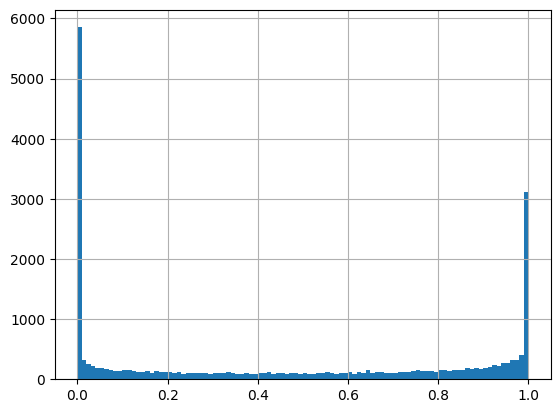

In [73]:
# plot urbanization rate for 2016
data[data['year'] == 2016]['urbanization'].hist(bins=100)